In [3]:
import pandas as pd

data = pd.read_csv('training_data.csv')
data

,id,text,class,volunteers_count,judgment_confidence
0,366,i would not feel hesitant in using the medical...,4,3.0,0.917835
1,9003,i try to stuff my wildly feeling heart and mes...,0,3.0,0.788853
2,16632,i just need to find ways to feel pretty,1,4.0,0.852762
3,2199,i think the protection part is the part where ...,0,4.0,0.793927
4,3079,im feeling mellow and am enjoying the cooler w...,1,4.0,0.953162
...,...,...,...,...,...
15459,11284,i really do feel it is beaten into us to breas...,0,4.0,0.773593
15460,11964,RT @Rockprincess818: Go fight against the IDF ...,2,6.0,0.500000
15461,5390,i dont feel the need to be truthful its comple...,1,5.0,1.000000
15462,860,im feeling pretty discouraged this morning,0,2.0,0.851956


In [4]:
train_df = data.drop('id',axis=1).drop('volunteers_count',axis=1).drop('judgment_confidence',axis=1)
train_df

,text,class
0,i would not feel hesitant in using the medical...,4
1,i try to stuff my wildly feeling heart and mes...,0
2,i just need to find ways to feel pretty,1
3,i think the protection part is the part where ...,0
4,im feeling mellow and am enjoying the cooler w...,1
...,...,...
15459,i really do feel it is beaten into us to breas...,0
15460,RT @Rockprincess818: Go fight against the IDF ...,2
15461,i dont feel the need to be truthful its comple...,1
15462,im feeling pretty discouraged this morning,0


In [5]:
train_df['class'].value_counts()

1    4397
0    3826
2    3440
3    1756
4    1573
5     472
Name: class, dtype: int64

In [6]:
!wget http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip

--2024-03-08 19:28:46--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glove.6B.zip        100%[===================>] 822.24M  5.16MB/s    in 2m 41s  

2024-03-08 19:31:26 (5.12 MB/s) - ‘glove.6B.zip’ saved [862182613/862182613]



In [7]:
!unzip glove.6B.zip

Archive:  glove.6B.zip
  inflating: glove.6B.50d.txt        
  inflating: glove.6B.100d.txt       
  inflating: glove.6B.200d.txt       
  inflating: glove.6B.300d.txt       


In [8]:
import numpy as np

words = dict()

def add_to_dict(d, filename):
  with open(filename, 'r') as f:
    for line in f.readlines():
      line = line.split(' ')

      try:
        d[line[0]] = np.array(line[1:], dtype=float)
      except:
        continue

add_to_dict(words, 'glove.6B.100d.txt')
words

{'the': array([-0.038194, -0.24487 ,  0.72812 , -0.39961 ,  0.083172,  0.043953,
        -0.39141 ,  0.3344  , -0.57545 ,  0.087459,  0.28787 , -0.06731 ,
         0.30906 , -0.26384 , -0.13231 , -0.20757 ,  0.33395 , -0.33848 ,
        -0.31743 , -0.48336 ,  0.1464  , -0.37304 ,  0.34577 ,  0.052041,
         0.44946 , -0.46971 ,  0.02628 , -0.54155 , -0.15518 , -0.14107 ,
        -0.039722,  0.28277 ,  0.14393 ,  0.23464 , -0.31021 ,  0.086173,
         0.20397 ,  0.52624 ,  0.17164 , -0.082378, -0.71787 , -0.41531 ,
         0.20335 , -0.12763 ,  0.41367 ,  0.55187 ,  0.57908 , -0.33477 ,
        -0.36559 , -0.54857 , -0.062892,  0.26584 ,  0.30205 ,  0.99775 ,
        -0.80481 , -3.0243  ,  0.01254 , -0.36942 ,  2.2167  ,  0.72201 ,
        -0.24978 ,  0.92136 ,  0.034514,  0.46745 ,  1.1079  , -0.19358 ,
        -0.074575,  0.23353 , -0.052062, -0.22044 ,  0.057162, -0.15806 ,
        -0.30798 , -0.41625 ,  0.37972 ,  0.15006 , -0.53212 , -0.2055  ,
        -1.2526  ,  0.071624,  

In [9]:
len(words)

400000

In [10]:
import nltk

nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [11]:
tokenizer = nltk.RegexpTokenizer(r"\w+")

tokenizer.tokenize('@user when a father is dysfunctional and is')

['user', 'when', 'a', 'father', 'is', 'dysfunctional', 'and', 'is']

In [12]:
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

lemmatizer.lemmatize('feet')

def message_to_token_list(s):
  tokens = tokenizer.tokenize(s)
  lowercased_tokens = [t.lower() for t in tokens]
  lemmatized_tokens = [lemmatizer.lemmatize(t) for t in lowercased_tokens]
  useful_tokens = [t for t in lemmatized_tokens if t in words]

  return useful_tokens

message_to_token_list('@user feet a fathers is dysfunctional and is')

['user', 'foot', 'a', 'father', 'is', 'dysfunctional', 'and', 'is']

In [13]:
def message_to_word_vectors(message, word_dict=words):
  processed_list_of_tokens = message_to_token_list(message)

  vectors = []

  for token in processed_list_of_tokens:
    if token not in word_dict:
      continue

    token_vector = word_dict[token]
    vectors.append(token_vector)

  return np.array(vectors, dtype=float)

In [14]:
message_to_word_vectors('@user when a father is dysfunctional and is').shape

(8, 100)

In [15]:
train_df = train_df.sample(frac=1, random_state=1)
train_df.reset_index(drop=True, inplace=True)

split_index_1 = int(len(train_df) * 0.7)
split_index_2 = int(len(train_df) * 0.85)

train_df, val_df, test_df = train_df[:split_index_1], train_df[split_index_1:split_index_2], train_df[split_index_2:]

len(train_df), len(val_df), len(test_df)

(10824, 2320, 2320)

In [16]:
train_df

,text,class
0,i am feeling abused for having wasted hundreds...,0
1,i got a feel that the actors were very physica...,1
2,i now feel more intelligent about my followers...,1
3,i continued to feel very submissive and contin...,0
4,@jeffgill24 hey #teabagger Bohner said he got ...,2
...,...,...
10819,RT @BlissTabitha: Homeowner Shoots Armed Suspe...,2
10820,id begun to feel empty and this was after havi...,0
10821,i have trouble in early afternoon and in the e...,0
10822,"The ""Yanks"" Are Coming: From Disparagement to ...",2


In [17]:
test_df

,text,class
13144,i says pressing his torso against siwons and b...,3
13145,i just feel so heartbroken out of loneliness,0
13146,I hope Charlie brought the lube for this test...,2
13147,i was tired of feeling helpless and wanted to ...,0
13148,"RT @HuffingtonPost: Obama: ""I will always do w...",2
...,...,...
15459,I'm the biggest redskins dam right now if they...,2
15460,i have all of that obviously because of what i...,1
15461,"I don't know what's more stressful, midterms o...",2
15462,hearing about developments of sience in the we...,0


In [18]:
def df_to_X_y(dff):

  if 'class' in dff.columns:
    y = dff['class'].to_numpy().astype(int)
  else: y = np.NaN

  all_word_vector_sequences = []

  for message in dff['text']:
    message_as_vector_seq = message_to_word_vectors(message)

    if message_as_vector_seq.shape[0] == 0:
      message_as_vector_seq = np.zeros(shape=(1, 100))

    all_word_vector_sequences.append(message_as_vector_seq)

  return all_word_vector_sequences, y

In [19]:
X_train, y_train = df_to_X_y(train_df)

print(len(X_train), len(X_train[0]))

10824 38


In [20]:
X_train

[array([[-0.046539,  0.61966 ,  0.56647 , ..., -0.37616 , -0.032502,
          0.8062  ],
        [-0.14022 ,  0.024659,  0.15813 , ..., -0.64749 ,  0.48866 ,
          0.15445 ],
        [ 0.29164 ,  0.39796 ,  1.0453  , ..., -0.46881 , -0.04079 ,
          0.45882 ],
        ...,
        [ 0.41002 , -0.11219 , -0.076341, ...,  0.017231,  0.59897 ,
          0.37484 ],
        [-0.30664 ,  0.16821 ,  0.98511 , ..., -0.38775 ,  0.36916 ,
          0.54521 ],
        [ 0.38658 ,  0.41196 ,  0.78037 , ...,  0.40154 ,  0.22872 ,
          0.50439 ]]),
 array([[-0.046539,  0.61966 ,  0.56647 , ..., -0.37616 , -0.032502,
          0.8062  ],
        [ 0.54635 ,  0.19018 ,  0.51298 , ...,  0.4414  ,  0.082234,
          0.42676 ],
        [-0.27086 ,  0.044006, -0.02026 , ..., -0.4923  ,  0.63687 ,
          0.23642 ],
        ...,
        [-0.093337,  0.19043 ,  0.68457 , ..., -0.68175 ,  0.28804 ,
          0.54893 ],
        [-0.1529  , -0.24279 ,  0.89837 , ..., -0.591   ,  1.0039  ,
   

In [21]:
print(len(X_train), len(X_train[2]))

10824 16


(array([1.560e+03, 3.078e+03, 2.814e+03, 1.839e+03, 7.940e+02, 4.200e+02,
        1.960e+02, 1.030e+02, 1.900e+01, 1.000e+00]),
 array([ 1.,  8., 15., 22., 29., 36., 43., 50., 57., 64., 71.]),
 <BarContainer object of 10 artists>)

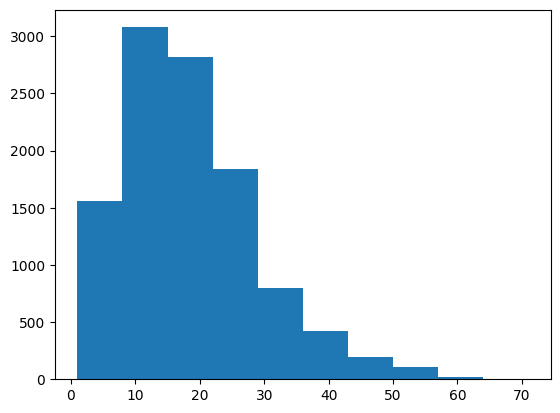

In [22]:
sequence_lengths = []

for i in range(len(X_train)):
  sequence_lengths.append(len(X_train[i]))

import matplotlib.pyplot as plt

plt.hist(sequence_lengths)

In [23]:
pd.Series(sequence_lengths).describe()

count    10824.000000
mean        17.974963
std         10.318875
min          1.000000
25%         10.000000
50%         16.000000
75%         24.000000
max         71.000000
dtype: float64

In [24]:
from copy import deepcopy

def pad_X(X, desired_sequence_length=75):
  X_copy = deepcopy(X)

  for i, x in enumerate(X):
    x_seq_len = x.shape[0]
    sequence_length_difference = desired_sequence_length - x_seq_len

    pad = np.zeros(shape=(sequence_length_difference, 100))

    X_copy[i] = np.concatenate([x, pad])

  return np.array(X_copy).astype(float)

In [25]:
X_train = pad_X(X_train)

X_train.shape

(10824, 75, 100)

In [26]:
y_train.shape

(10824,)

In [27]:
X_val, y_val = df_to_X_y(val_df)
X_val = pad_X(X_val)

X_val.shape, y_val.shape

((2320, 75, 100), (2320,))

In [28]:
X_test, y_test = df_to_X_y(test_df)
X_test = pad_X(X_test)

X_test.shape, y_test.shape

((2320, 75, 100), (2320,))

In [29]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

model = Sequential([])

model.add(layers.Input(shape=(75, 100)))
model.add(layers.LSTM(64, return_sequences=True))
model.add(layers.Dropout(0.2))
model.add(layers.LSTM(64, return_sequences=True))
model.add(layers.Dropout(0.2))
model.add(layers.LSTM(64, return_sequences=True))
model.add(layers.Dropout(0.2))
model.add(layers.Flatten())
model.add(layers.Dense(6, activation='softmax'))


In [30]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 75, 64)            42240     
                                                                 
 dropout (Dropout)           (None, 75, 64)            0         
                                                                 
 lstm_1 (LSTM)               (None, 75, 64)            33024     
                                                                 
 dropout_1 (Dropout)         (None, 75, 64)            0         
                                                                 
 lstm_2 (LSTM)               (None, 75, 64)            33024     
                                                                 
 dropout_2 (Dropout)         (None, 75, 64)            0         
                                                                 
 flatten (Flatten)           (None, 4800)              0

In [31]:
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import SparseCategoricalAccuracy
from tensorflow.keras.callbacks import ModelCheckpoint

cp = ModelCheckpoint('model/', save_best_only=True)

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [32]:
# netla3 bih l accuracy au cas ou
frequencies = pd.value_counts(train_df['class'])

frequencies

1    3065
0    2716
2    2416
3    1209
4    1093
5     325
Name: class, dtype: int64

In [33]:
type(X_train)

numpy.ndarray

In [34]:
from tensorflow.keras.utils import to_categorical

# Assuming y_train and y_val are your original target labels

# Convert target labels to one-hot encoding
y_train_encoded = to_categorical(y_train, num_classes=6)
y_val_encoded = to_categorical(y_val, num_classes=6)

In [44]:
model.fit(X_train, y_train_encoded, validation_data=(X_val, y_val_encoded), epochs=20)


Epoch 1/20
339/339 [==============================] - 70s 207ms/step - loss: 1.0088 - accuracy: 0.6127 - val_loss: 0.9554 - val_accuracy: 0.6487
Epoch 2/20
339/339 [==============================] - 72s 212ms/step - loss: 0.7566 - accuracy: 0.7184 - val_loss: 0.6833 - val_accuracy: 0.7517
Epoch 3/20
339/339 [==============================] - 65s 192ms/step - loss: 0.4963 - accuracy: 0.8285 - val_loss: 0.5022 - val_accuracy: 0.8293
Epoch 4/20
339/339 [==============================] - 75s 221ms/step - loss: 0.3252 - accuracy: 0.8859 - val_loss: 0.3396 - val_accuracy: 0.8931
Epoch 5/20
339/339 [==============================] - 64s 189ms/step - loss: 0.2501 - accuracy: 0.9141 - val_loss: 0.2879 - val_accuracy: 0.9095
Epoch 6/20
339/339 [==============================] - 66s 195ms/step - loss: 0.1747 - accuracy: 0.9368 - val_loss: 0.2826 - val_accuracy: 0.9203
Epoch 7/20
339/339 [==============================] - 70s 207ms/step - loss: 0.1536 - accuracy: 0.9448 - val_loss: 0.2373 - val_ac

In [45]:
model.save('/model')

In [46]:
from tensorflow.keras.models import load_model

best_model = load_model('/model')

## Testing the model on the training data

In [51]:
X_test

array([[[-0.046539 ,  0.61966  ,  0.56647  , ..., -0.37616  ,
         -0.032502 ,  0.8062   ],
        [-0.091682 ,  0.58105  ,  0.40477  , ..., -0.38741  ,
          0.34695  ,  0.229    ],
        [-0.79134  ,  0.1159   ,  0.32713  , ...,  0.20665  ,
          1.2389   ,  0.28692  ],
        ...,
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ]],

       [[-0.046539 ,  0.61966  ,  0.56647  , ..., -0.37616  ,
         -0.032502 ,  0.8062   ],
        [ 0.075026 ,  0.39325  ,  0.90314  , ..., -0.18816  ,
          0.46636  ,  0.66819  ],
        [-0.042895 ,  0.70671  ,  0.75316  , ..., -0.5423   ,
          0.11809  ,  0.39974  ],
        ...,
        [ 0.       ,  0.       ,  0.       , ...,  0.       ,
          0.       ,  0.       ],
        [ 0.

In [47]:
import numpy as np

# Get class probabilities from the model predictions
test_probabilities = best_model.predict(X_test)

# Convert probabilities to class labels
test_predictions = np.argmax(test_probabilities, axis=1)

from sklearn.metrics import classification_report

print(classification_report(y_test, test_predictions))

73/73 [==============================] - 9s 70ms/step
              precision    recall  f1-score   support

           0       0.93      0.90      0.92       542
           1       0.97      0.95      0.96       669
           2       0.99      0.98      0.98       522
           3       0.84      0.92      0.88       275
           4       0.82      0.92      0.87       236
           5       0.88      0.67      0.76        76

    accuracy                           0.93      2320
   macro avg       0.91      0.89      0.89      2320
weighted avg       0.93      0.93      0.93      2320



In [36]:
test = pd.read_csv('/content/testing_data.csv')

In [37]:
test

,id,text,volunteers_count,judgment_confidence
0,8846,RT @DNAinfoCHI: The new nature area replacing ...,3.0,1.000000
1,10369,i feel very triumphant when ive found s,3.0,0.839630
2,16112,i feel ive been beaten down by the words of me...,3.0,0.924088
3,13646,i thought how great it must feel for the autho...,3.0,0.890124
4,651,RT @Yankees: .@DRob30 comes in to close out th...,3.0,1.000000
...,...,...,...,...
3390,12854,i guess which meant or so i assume no photos n...,3.0,1.000000
3391,5893,i was feeling pretty impressed with myself,4.0,0.951436
3392,10017,RT @taylorcaniff: I wear beanies all winter lo...,3.0,1.000000
3393,1593,i feel like maybe everything is resolved for o...,3.0,0.938612


In [53]:
X_pred = test.drop(['id','volunteers_count','judgment_confidence'], axis=1)

In [39]:
X_pred


,text
0,RT @DNAinfoCHI: The new nature area replacing ...
1,i feel very triumphant when ive found s
2,i feel ive been beaten down by the words of me...
3,i thought how great it must feel for the autho...
4,RT @Yankees: .@DRob30 comes in to close out th...
...,...
3390,i guess which meant or so i assume no photos n...
3391,i was feeling pretty impressed with myself
3392,RT @taylorcaniff: I wear beanies all winter lo...
3393,i feel like maybe everything is resolved for o...


In [54]:
X_pred = df_to_X_y(X_pred)
X_pred

([array([[-0.34818 , -0.101   , -0.1646  , ..., -0.3606  ,  0.19278 ,
          -0.85548 ],
         [-0.038194, -0.24487 ,  0.72812 , ..., -0.1459  ,  0.8278  ,
           0.27062 ],
         [-0.043959,  0.18936 ,  0.6611  , ..., -0.14168 ,  0.92789 ,
           0.59058 ],
         ...,
         [-0.21854 ,  0.33798 ,  0.42323 , ...,  0.056449, -0.66971 ,
          -0.30913 ],
         [ 0.18545 ,  0.63305 ,  0.49348 , ..., -0.90674 , -0.027379,
          -1.1512  ],
         [-0.78276 ,  0.80839 ,  0.34307 , ...,  0.083831,  0.47065 ,
           0.59265 ]]),
  array([[-4.6539e-02,  6.1966e-01,  5.6647e-01, -4.6584e-01, -1.1890e+00,
           4.4599e-01,  6.6035e-02,  3.1910e-01,  1.4679e-01, -2.2119e-01,
           7.9239e-01,  2.9905e-01,  1.6073e-01,  2.5324e-02,  1.8678e-01,
          -3.1001e-01, -2.8108e-01,  6.0515e-01, -1.0654e+00,  5.2476e-01,
           6.4152e-02,  1.0358e+00, -4.0779e-01, -3.8011e-01,  3.0801e-01,
           5.9964e-01, -2.6991e-01, -7.6035e-01,  9.4222e

In [56]:
X_pred = pad_X(X_pred[0])
X_pred

array([[[-3.4818e-01, -1.0100e-01, -1.6460e-01, ..., -3.6060e-01,
          1.9278e-01, -8.5548e-01],
        [-3.8194e-02, -2.4487e-01,  7.2812e-01, ..., -1.4590e-01,
          8.2780e-01,  2.7062e-01],
        [-4.3959e-02,  1.8936e-01,  6.6110e-01, ..., -1.4168e-01,
          9.2789e-01,  5.9058e-01],
        ...,
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00]],

       [[-4.6539e-02,  6.1966e-01,  5.6647e-01, ..., -3.7616e-01,
         -3.2502e-02,  8.0620e-01],
        [-4.2895e-02,  7.0671e-01,  7.5316e-01, ..., -5.4230e-01,
          1.1809e-01,  3.9974e-01],
        [-8.4136e-01,  3.0985e-01,  5.8170e-02, ..., -7.4566e-01,
         -1.1064e-01,  4.6134e-01],
        ...,
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, ...,  

In [42]:
print(len(X_pred), len(X_pred[0]))

2 3395


In [49]:
X_pred

([array([[-0.34818 , -0.101   , -0.1646  , ..., -0.3606  ,  0.19278 ,
          -0.85548 ],
         [-0.038194, -0.24487 ,  0.72812 , ..., -0.1459  ,  0.8278  ,
           0.27062 ],
         [-0.043959,  0.18936 ,  0.6611  , ..., -0.14168 ,  0.92789 ,
           0.59058 ],
         ...,
         [-0.21854 ,  0.33798 ,  0.42323 , ...,  0.056449, -0.66971 ,
          -0.30913 ],
         [ 0.18545 ,  0.63305 ,  0.49348 , ..., -0.90674 , -0.027379,
          -1.1512  ],
         [-0.78276 ,  0.80839 ,  0.34307 , ...,  0.083831,  0.47065 ,
           0.59265 ]]),
  array([[-4.6539e-02,  6.1966e-01,  5.6647e-01, -4.6584e-01, -1.1890e+00,
           4.4599e-01,  6.6035e-02,  3.1910e-01,  1.4679e-01, -2.2119e-01,
           7.9239e-01,  2.9905e-01,  1.6073e-01,  2.5324e-02,  1.8678e-01,
          -3.1001e-01, -2.8108e-01,  6.0515e-01, -1.0654e+00,  5.2476e-01,
           6.4152e-02,  1.0358e+00, -4.0779e-01, -3.8011e-01,  3.0801e-01,
           5.9964e-01, -2.6991e-01, -7.6035e-01,  9.4222e

In [ ]:
X_pred

## Testing the model on the testing data

In [58]:
import numpy as np

# Get class probabilities from the model predictions
test_probabilities = best_model.predict(X_pred)

# Convert probabilities to class labels
test_predictions = np.argmax(test_probabilities, axis=1)
test_predictions

107/107 [==============================] - 9s 82ms/step


array([2, 1, 0, ..., 2, 1, 1])

In [65]:
sub = pd.read_csv("/content/submission_file.csv")
sub['class'] = test_predictions.tolist()

sub.head()
sub.to_csv('submission_with_predicted_probabilitiesV3.csv', index=False)

In [66]:
sub

,Id,class
0,8846,2
1,10369,1
2,16112,0
3,13646,1
4,651,2
...,...,...
3390,12854,1
3391,5893,5
3392,10017,2
3393,1593,1
